In [1]:
# note 25/05/17: with the most up to date things, hp.UNSEEN pixels need to be set to zero before computing the PS
# SO noise input vs what's simulated doesn't match at the moment. It could be due to weighting/masks being applied
# to the simulated maps vs corrections done

import sensitivity_calculator as sens
import numpy as np
import matplotlib.pyplot as plt
from pprint import pprint

[Steves-MacBook-Pro-2.local:44610] shmem: mmap: an error occurred while determining whether or not /var/folders/8v/41zl_6h10wl_8p6t8pphs03c0000gn/T//ompi.Steves-MacBook-Pro-2.501/jf.0/3959029760/sm_segment.Steves-MacBook-Pro-2.501.ebfa0000.0 could be created.


In [2]:
import pixell
print(pixell.__version__)

0.17.3


In [3]:
# calculate CCAT sensitivities

inputs = {'diameter': 5.7, 't': 273, 'wfe': 10.7, 'eta': 0.98, 'doe': 0.8, 't_int': 1, 'pixelYield': 0.8, 
        'szCamNumPoln': 1, 'eorSpecNumPoln': 2, 't_filter_cold': np.array([0.593, 0.84 , 0.909, 0.922, 0.89 ]), 
        't_lens_cold': np.array([0.98, 0.98, 0.98, 0.98, 0.98]), 
        't_uhdpe_window': np.array([0.96, 0.97, 0.97, 0.97, 0.97]), 
        'singleModedAOmegaLambda2': np.array([1., 1., 1., 1., 1.]), 
        'spatialPixels': np.array([36450, 20808, 10368, 10368,  7938]), 
        'eqbw': np.array([9.7e+10, 3.0e+10, 3.6e+10, 7.0e+10, 5.6e+10]), 
        'centerFrequency': np.array([8.50e+11, 4.05e+11, 3.48e+11, 2.85e+11, 2.22e+11]), 'detectorNEP': 0, 
        'backgroundSubtractionDegradationFactor': 1, 'r': np.array([[100., 100., 100.],
                                            [100., 100., 100.],
                                            [100., 100., 100.],
                                            [100., 100., 100.],
                                            [100., 100., 100.]]), 
        'decimalPlaces': 3, 'observationElevationAngle': 45, 'outputFreq': True, 
        'detectorSpacing': np.array([1.51, 1.97, 2.75, 2.75, 3.13]), 'lyotStopAngle': 13.4}
# Alternatively, sens.getInputs("input.yaml")

spillEfficiency = sens.getSpillEfficiency(inputs)
calculate = sens.calcByAngle(inputs["diameter"], inputs["t"], inputs["wfe"], inputs["eta"], inputs["doe"], inputs["t_int"], inputs["pixelYield"], inputs["szCamNumPoln"], inputs["eorSpecNumPoln"],
                            inputs["t_filter_cold"], inputs["t_lens_cold"], inputs["t_uhdpe_window"], spillEfficiency, inputs["singleModedAOmegaLambda2"],
                            inputs["spatialPixels"], inputs["eqbw"], inputs["centerFrequency"], inputs["detectorNEP"],
                            inputs["backgroundSubtractionDegradationFactor"], inputs["r"])
outputs = calculate(45)
data_C = sens.sensitivity._data_C_calcV2(inputs)
print(data_C)
print('powerPerPixel')
pprint(outputs['powerPerPixel']*1e12)
print('photonNoiseNEP')
pprint(outputs['photonNoiseNEP'])
print('EqTrans')
pprint(outputs['EqTrans'])
print('netW8Avg')
pprint(outputs['netW8Avg'])


[2.40884273e+14 4.26633257e+08 4.79895258e+07 2.64321605e+06
 2.40186068e+05]
powerPerPixel
array([[ 69.46645125,  88.98561733, 107.81397311],
       [  8.6836126 ,  11.86517396,  16.96739406],
       [  9.16322085,  12.41274202,  18.16045145],
       [  9.14318823,  11.38320104,  15.62777464],
       [  4.9214084 ,   5.78890424,   7.47975265]])
photonNoiseNEP
array([[3.19851210e-16, 3.92163517e-16, 4.61422446e-16],
       [8.63471707e-17, 1.12931531e-16, 1.55313559e-16],
       [7.70652151e-17, 9.94143363e-17, 1.38622105e-16],
       [6.49708791e-17, 7.75645878e-17, 1.01188036e-16],
       [4.22702461e-17, 4.81881556e-17, 5.96266048e-17]])
EqTrans
array([[0.44335381, 0.26926235, 0.10133222],
       [0.78200698, 0.68309711, 0.52447691],
       [0.87638215, 0.81411504, 0.70397781],
       [0.9394851 , 0.91192784, 0.8597099 ],
       [0.96024402, 0.94407599, 0.91256267]])
netW8Avg
array([1.79834572e+05, 1.85451938e+02, 6.10952271e+01, 1.38741392e+01,
       7.71900364e+00])


In [4]:
ell, N_ell_T_full, N_ell_P_full = sens.getNoiseCurves(inputs, outputs)

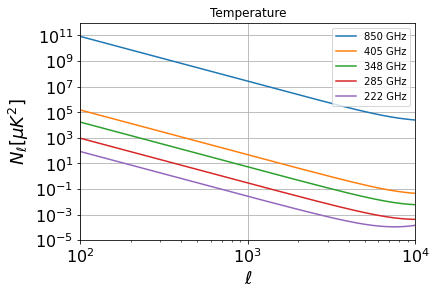

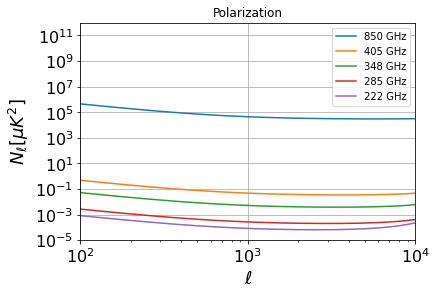

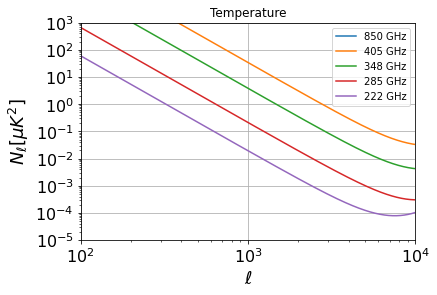

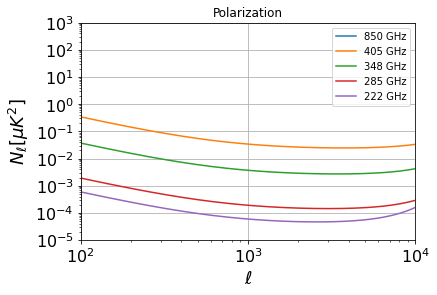

In [5]:
for curves, labels, title in zip([N_ell_T_full, N_ell_P_full], [inputs["centerFrequency"]] * 2, ["Temperature", "Polarization"]):
    for curve, label in zip(curves, labels):
        plt.plot(ell, curve, label=str(int(label/1e9))+' GHz')
    plt.yscale('log')
    plt.xscale('log')
    plt.xlim(10**2, 10**4)
    plt.ylim(10**-5, 10**12)
    plt.xlabel('$\ell$',fontsize=18)
    plt.ylabel('$N_\ell [\mu K^2]$',fontsize=18)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.title(title)
    plt.legend(loc='upper right')
    plt.grid()
    plt.show()
    
for curves, labels, title in zip([N_ell_T_full, N_ell_P_full], [inputs["centerFrequency"]] * 2, ["Temperature", "Polarization"]):
    for curve, label in zip(curves, labels):
        plt.plot(ell, curve*835/865*15/20, label=str(int(label/1e9))+' GHz')
#         plt.plot(ell, curve*581/952*15/20, label=str(int(label/1e9))+' GHz')

    plt.yscale('log')
    plt.xscale('log')
    plt.xlim(10**2, 10**4)
    plt.ylim(10**-5, 10**3)
    plt.xlabel('$\ell$',fontsize=18)
    plt.ylabel('$N_\ell [\mu K^2]$',fontsize=18)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.title(title)
    plt.legend(loc='upper right')
    plt.grid()
    plt.show()

In [6]:
sens

<module 'sensitivity_calculator' from '/usr/local/lib/python3.9/site-packages/sensitivity_calculator/__init__.py'>

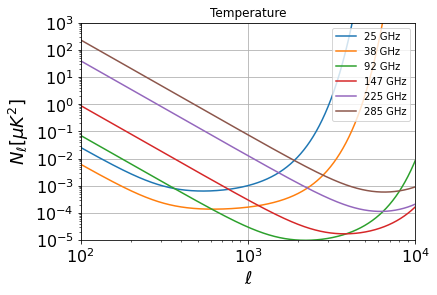

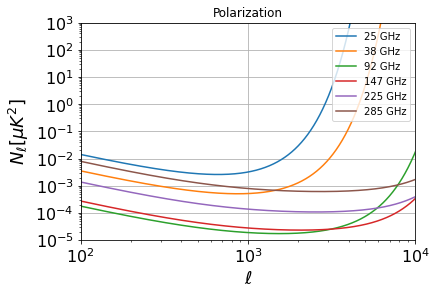

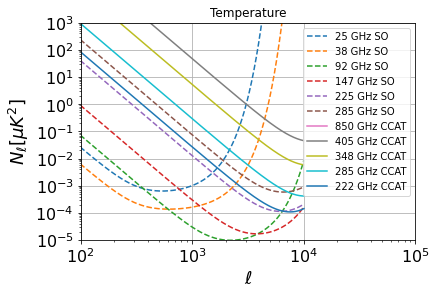

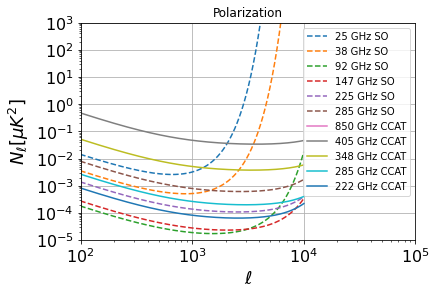

In [7]:
import sys
sys.path.append('/Users/stevekchoi/work/util/foregrounds')
sys.path.append('/Users/stevekchoi/work/ps/psc')
import sc_freq_scale as sfs
import pcl_actpol_utility_v4 as pau
from so_models_v3 import SO_Noise_Calculator_Public_v3_1_1 as SO_noise
mode = 'baseline'
fsky = 0.4
lat = SO_noise.SOLatV3point1(mode,survey_years=5.,survey_efficiency = 0.2*0.85)
lat_lmax = 10000

so_freq_list = np.array([25.7, 38.9, 92, 147.5, 225.7, 285.4])

ell_LA, N_ell_LA_T_full,N_ell_LA_P_full = lat.get_noise_curves(
        fsky, lat_lmax, 1, full_covar=False, deconv_beam=True)

for curves, labels, title in zip([N_ell_LA_T_full, N_ell_LA_P_full], [so_freq_list] * 2, ["Temperature", "Polarization"]):
    for curve, label in zip(curves, labels):
        plt.plot(ell_LA, curve, label=str(int(label))+' GHz')
    plt.yscale('log')
    plt.xscale('log')
    plt.xlim(10**2, 10**4)
    plt.ylim(10**-5, 10**3)
    plt.xlabel('$\ell$',fontsize=18)
    plt.ylabel('$N_\ell [\mu K^2]$',fontsize=18)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.title(title)
    plt.legend(loc='upper right')
    plt.grid()
    plt.show()


for curves, labels, title in zip([N_ell_LA_T_full], [so_freq_list] , ["Temperature"]):
    for curve, label in zip(curves, labels):
        plt.plot(ell_LA, curve, label=str(int(label))+' GHz SO',linestyle='--')

for curves, labels, title in zip([N_ell_T_full], [inputs["centerFrequency"]] , ["Temperature"]):
    for curve, label in zip(curves, labels):
        plt.plot(ell, curve, label=str(int(label/1e9))+' GHz CCAT')

    plt.yscale('log')
    plt.xscale('log')
    plt.xlim(10**2, 10**5)
    plt.ylim(10**-5, 10**3)
    plt.xlabel('$\ell$',fontsize=18)
    plt.ylabel('$N_\ell [\mu K^2]$',fontsize=18)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.title(title)
    plt.legend(loc='upper right')
    plt.grid()
    plt.show()

for curves, labels, title in zip([N_ell_LA_P_full], [so_freq_list] , ["Polarization"]):
    for curve, label in zip(curves, labels):
        plt.plot(ell_LA, curve, label=str(int(label))+' GHz SO',linestyle='--')

for curves, labels, title in zip([N_ell_P_full], [inputs["centerFrequency"]] , ["Polarization"]):
    for curve, label in zip(curves, labels):
        plt.plot(ell, curve, label=str(int(label/1e9))+' GHz CCAT')

    plt.yscale('log')
    plt.xscale('log')
    plt.xlim(10**2, 10**5)
    plt.ylim(10**-5, 10**3)
    plt.xlabel('$\ell$',fontsize=18)
    plt.ylabel('$N_\ell [\mu K^2]$',fontsize=18)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.title(title)
    plt.legend(loc='upper right')
    plt.grid()
    plt.show()





zf: 0.49851000657631245
HF1 LC1 222 GHz


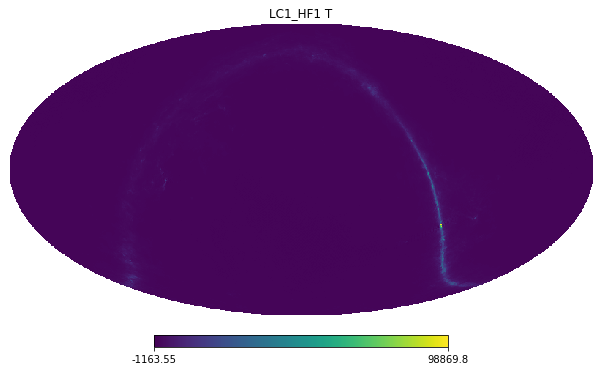

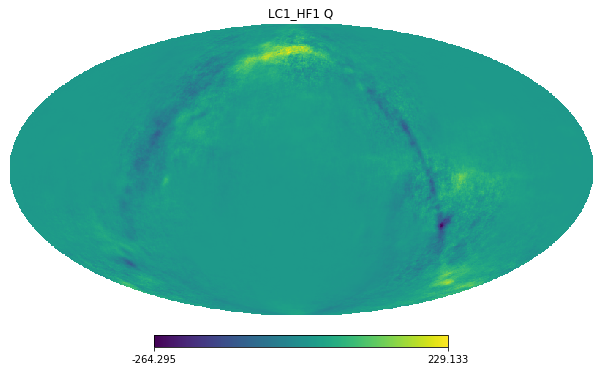

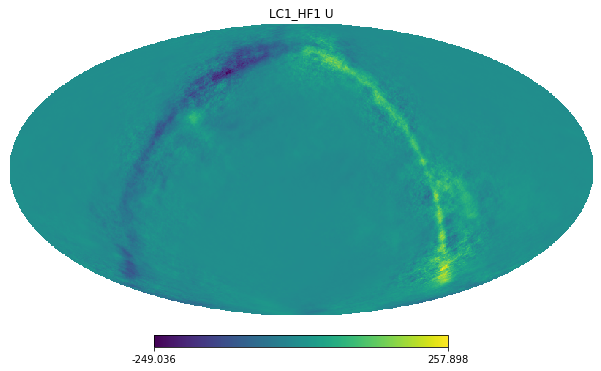

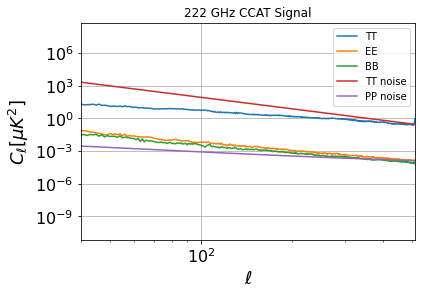

HF2 LC2 280 GHz


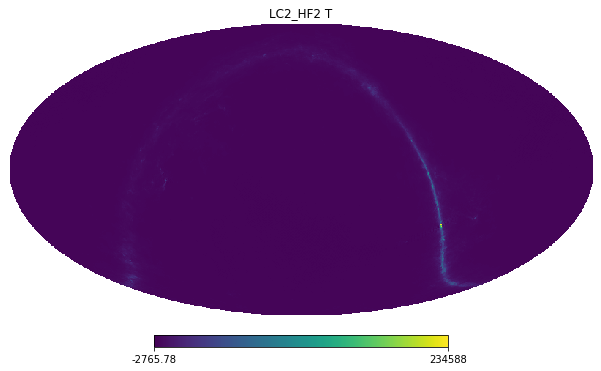

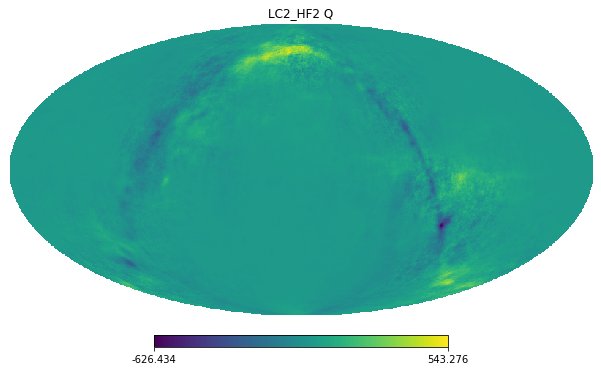

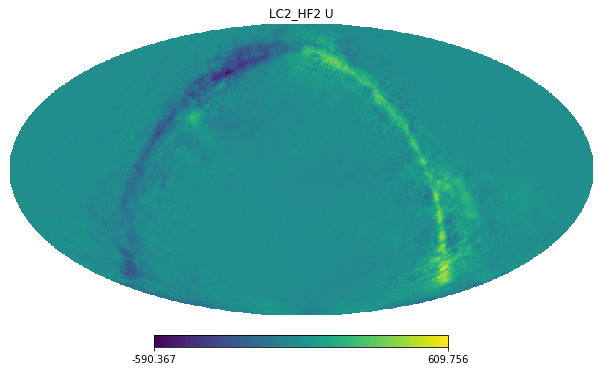

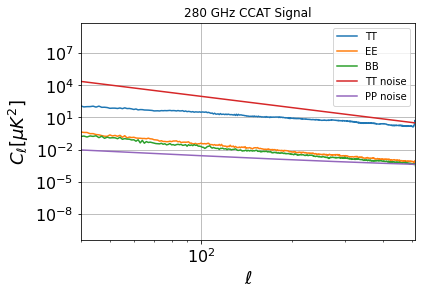

HF3 LC3 348 GHz


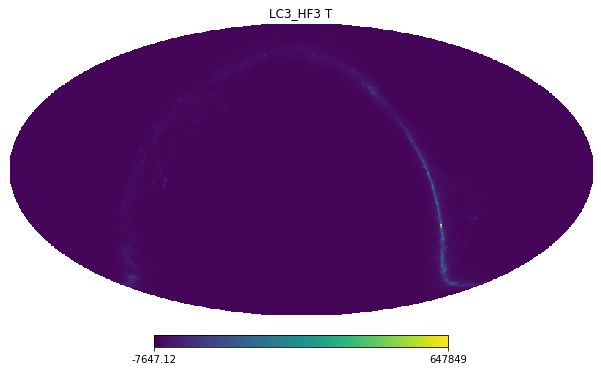

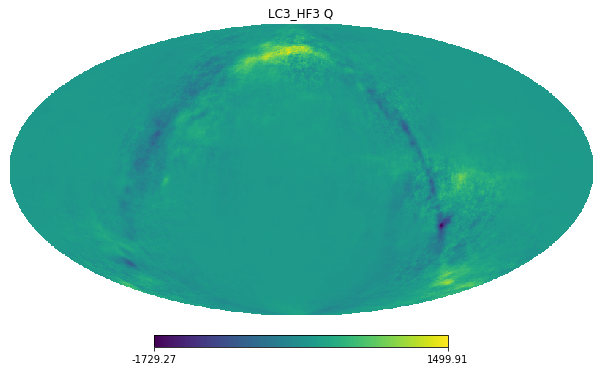

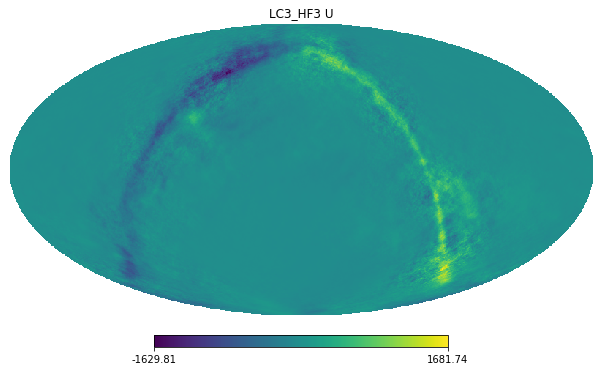

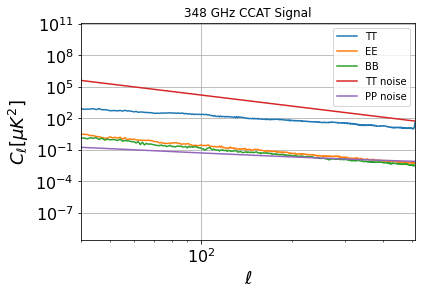

HF4 LC4 405 GHz


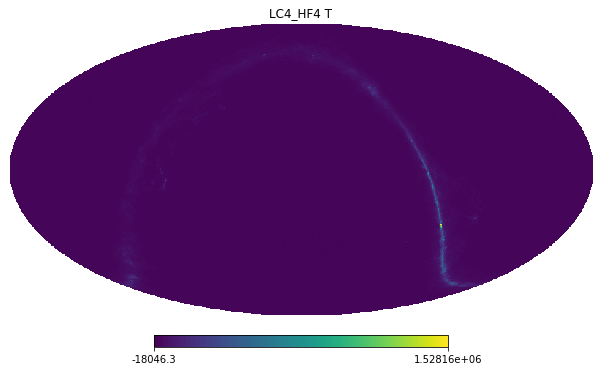

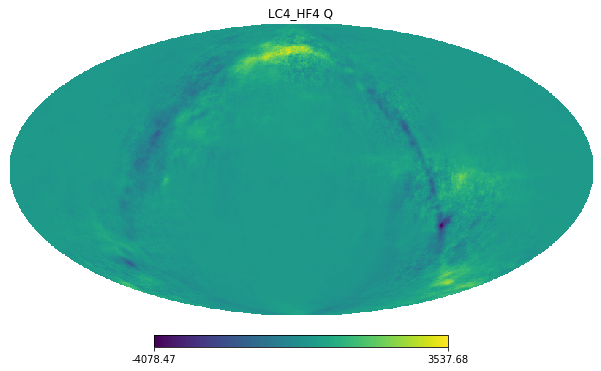

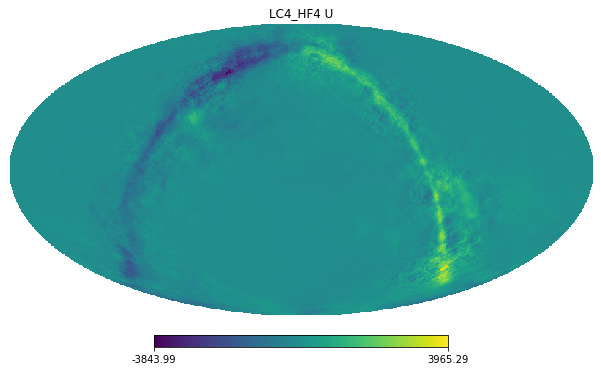

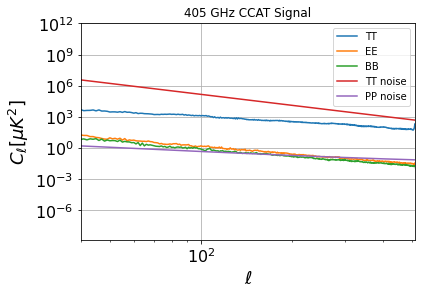

HF5 LC5 850 GHz


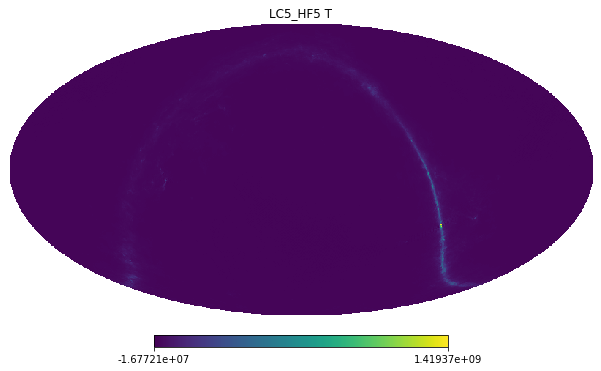

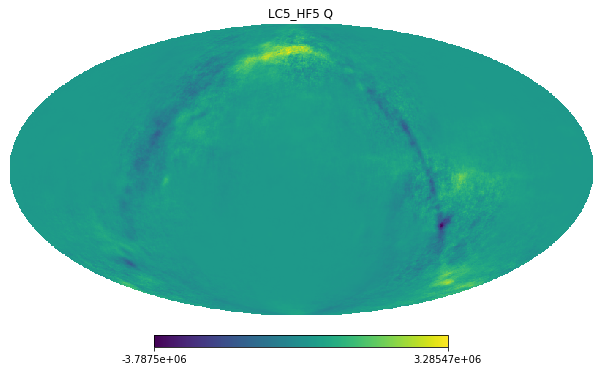

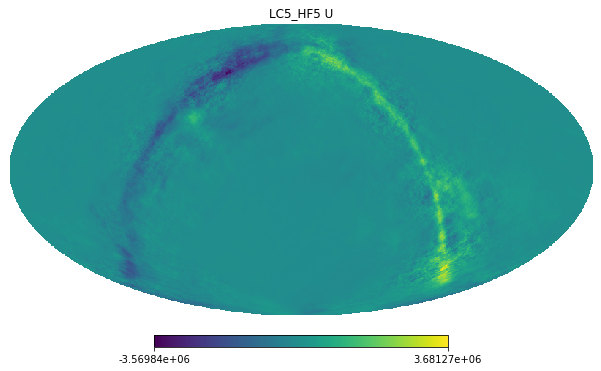

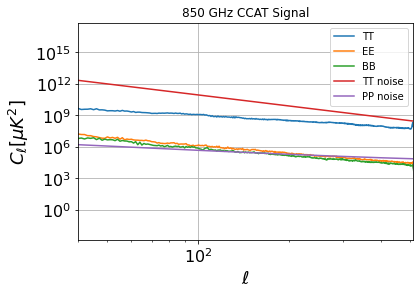

HF1 LC1 222 GHz


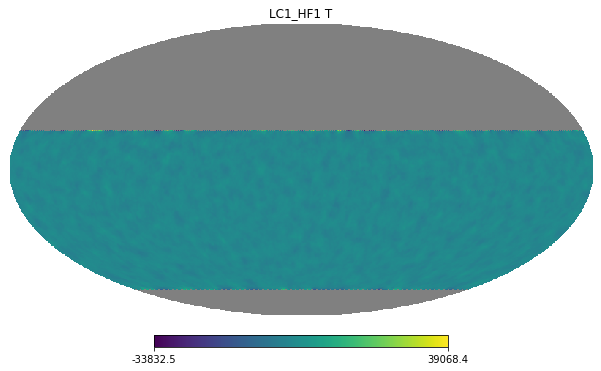

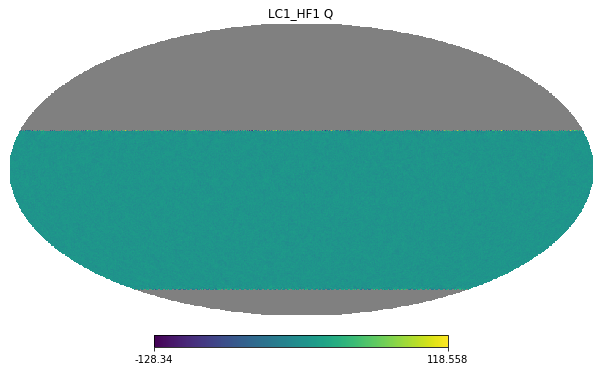

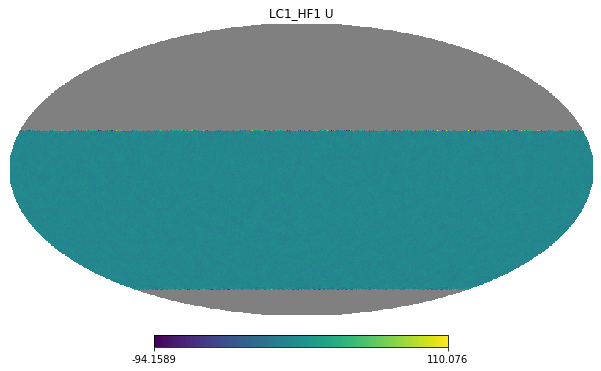

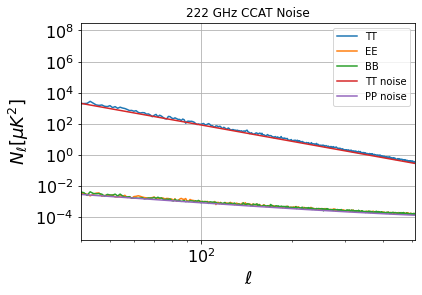

HF2 LC2 280 GHz


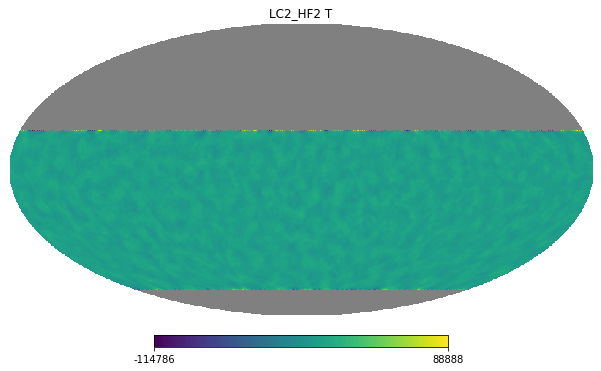

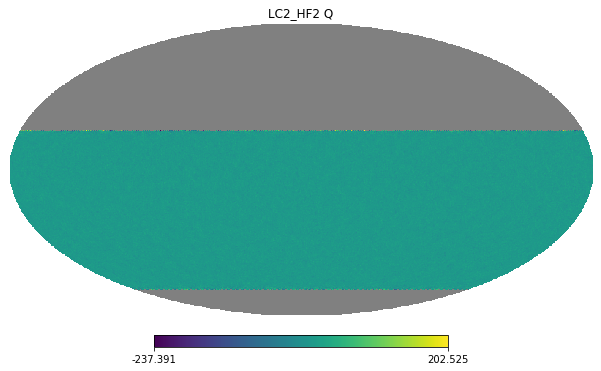

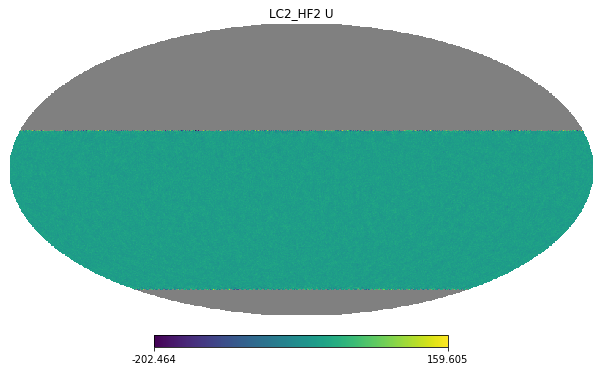

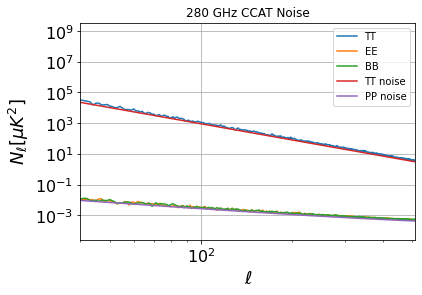

HF3 LC3 348 GHz


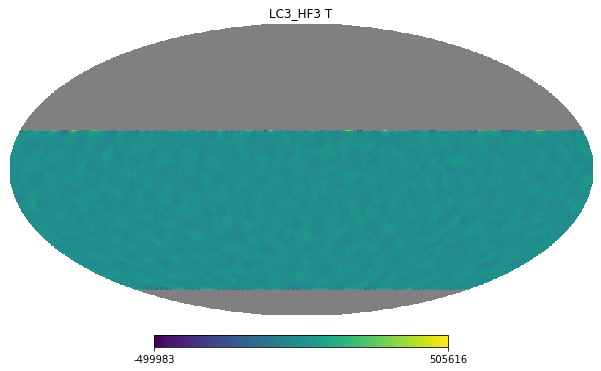

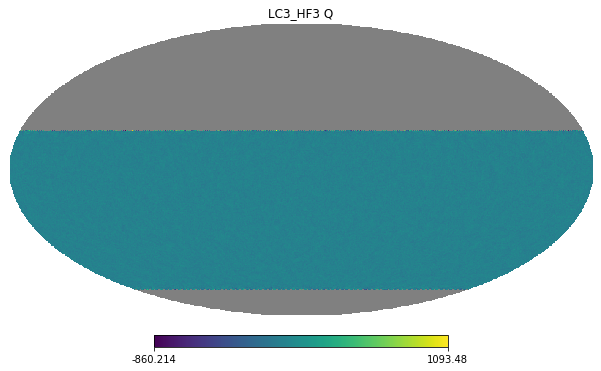

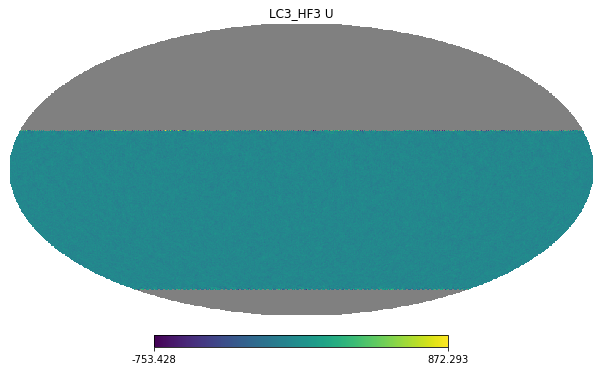

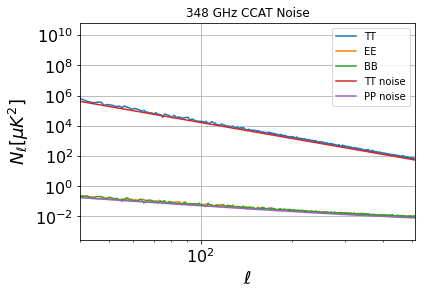

HF4 LC4 405 GHz


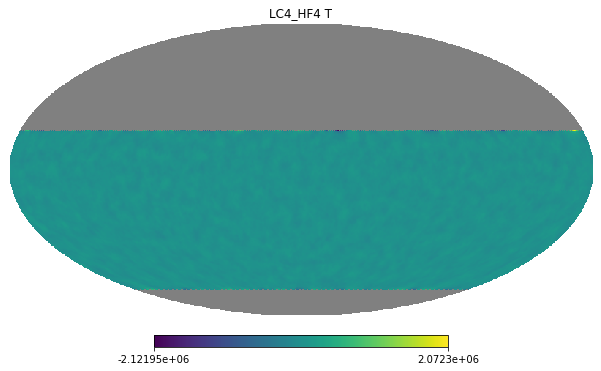

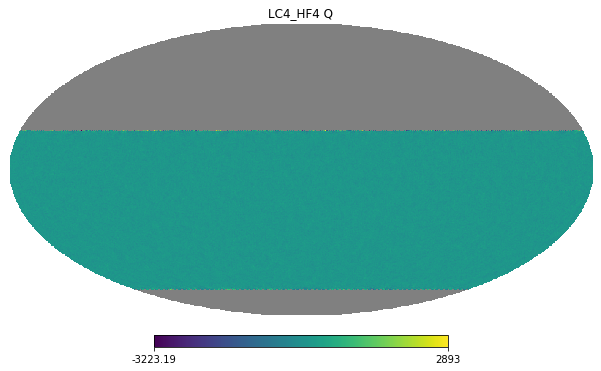

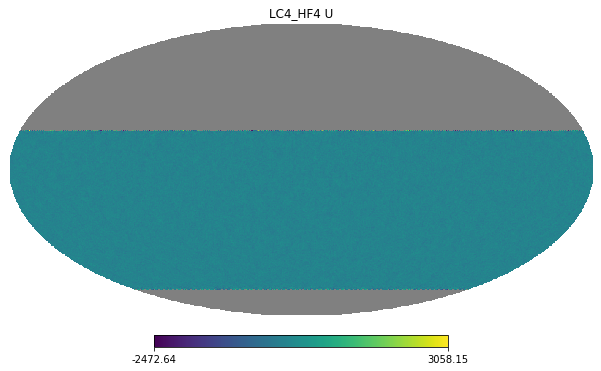

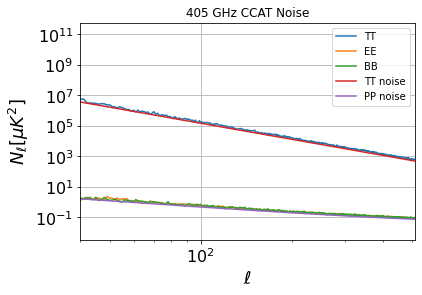

HF5 LC5 850 GHz


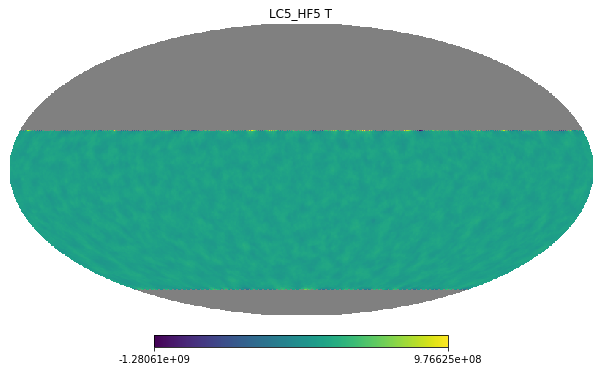

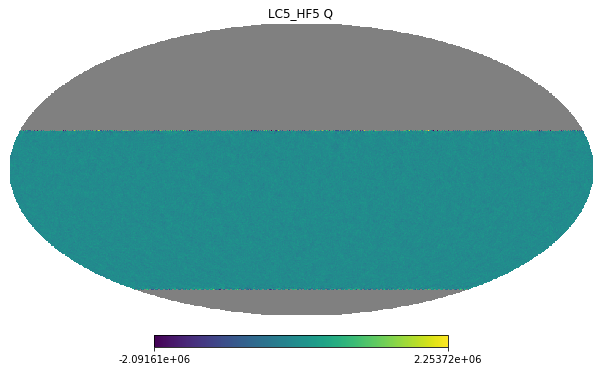

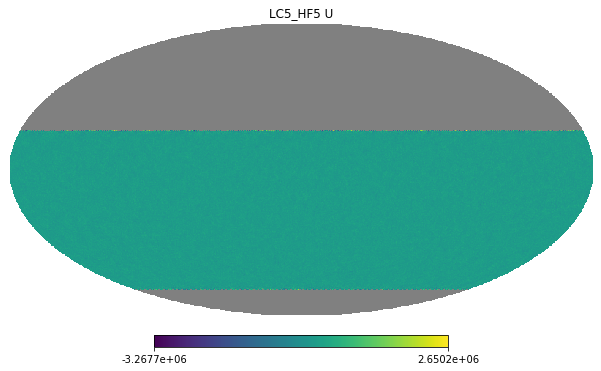

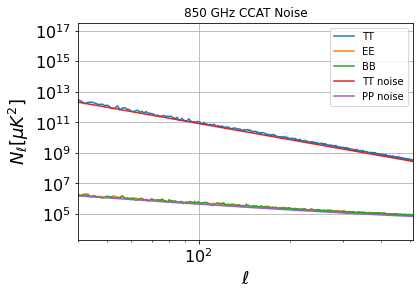

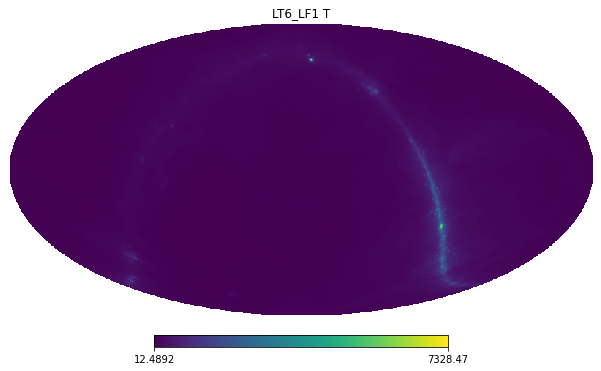

...

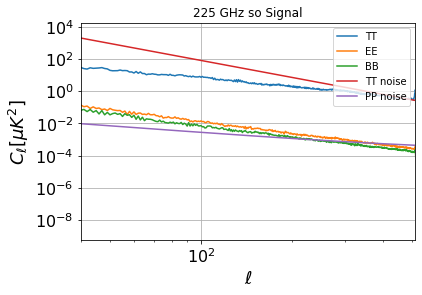

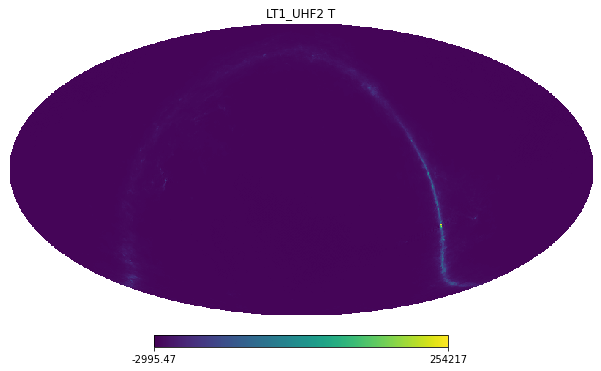

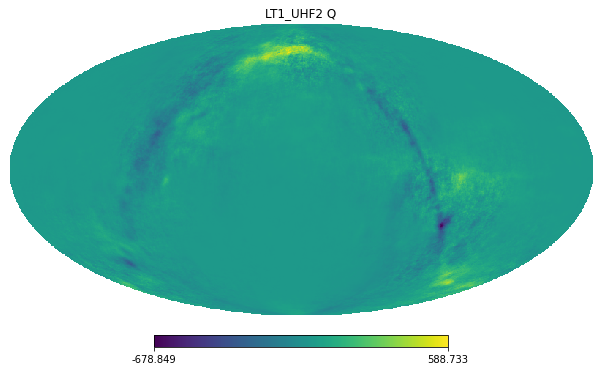

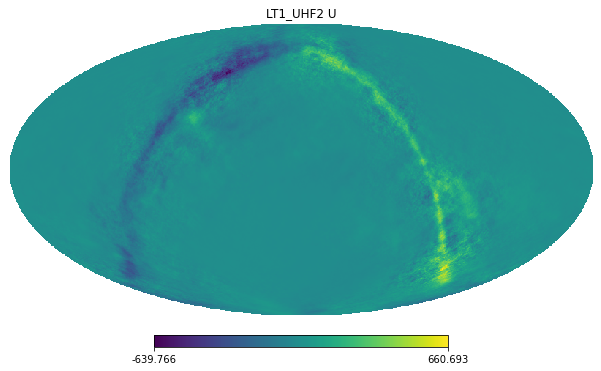

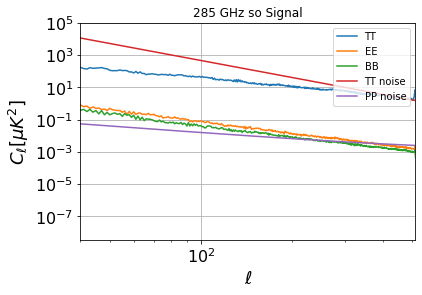

Retrieve data for LT6_LF1_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)
Retrieve data for LT6_LF2_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)


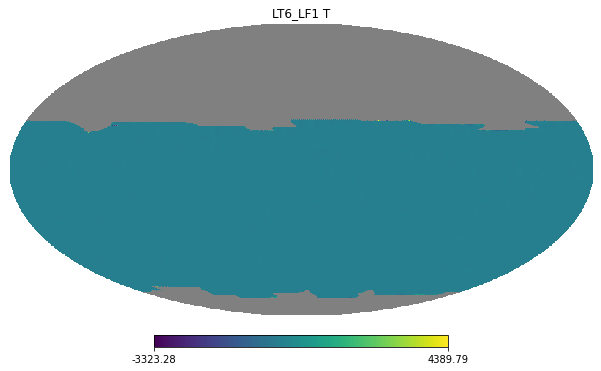

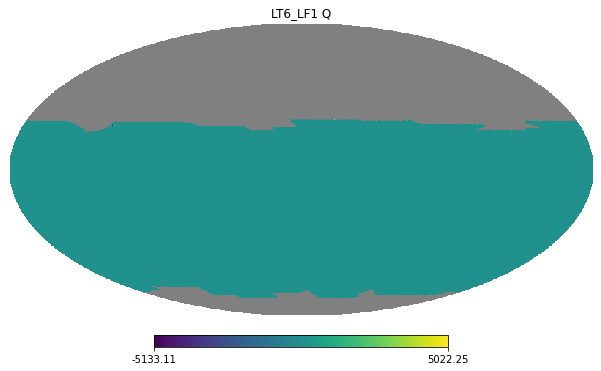

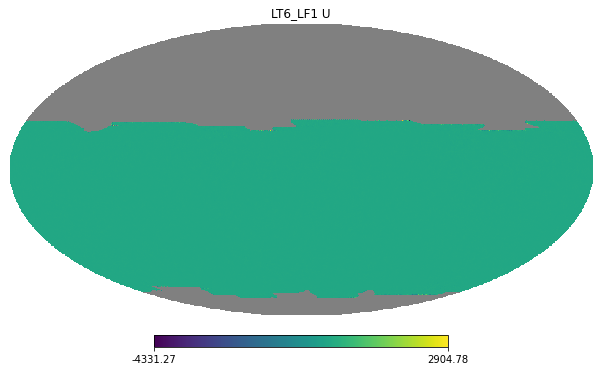

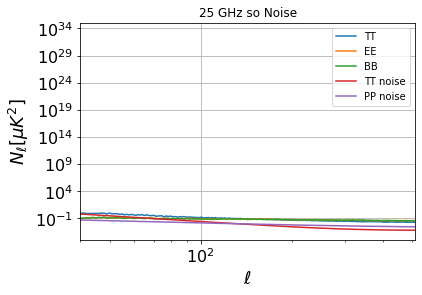

Retrieve data for LT6_LF1_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)
Retrieve data for LT6_LF2_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)


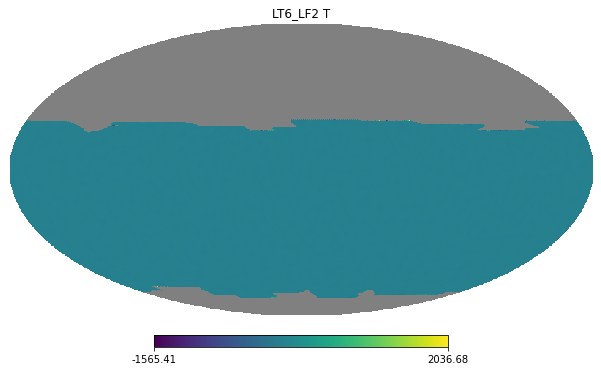

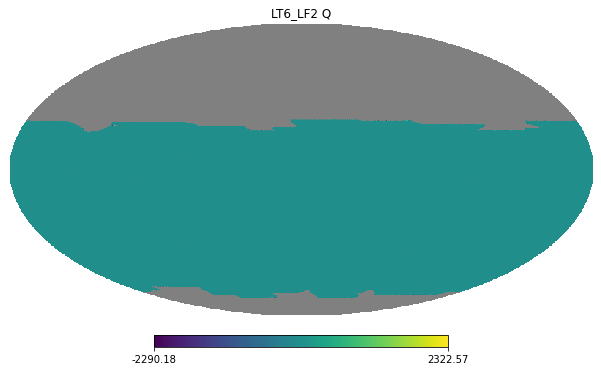

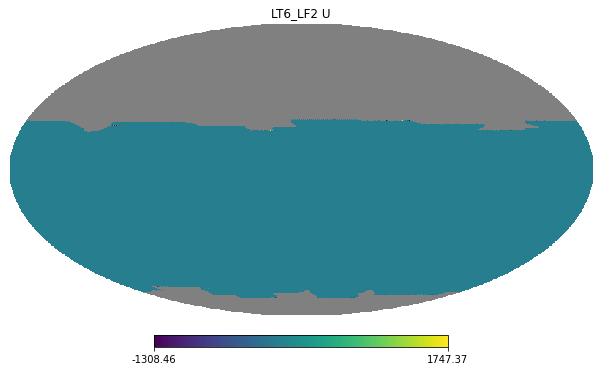

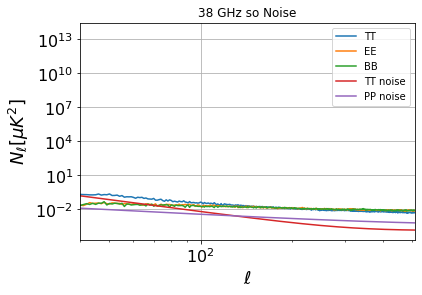

Retrieve data for LT2_MFF1_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)
Retrieve data for LT2_MFF2_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)


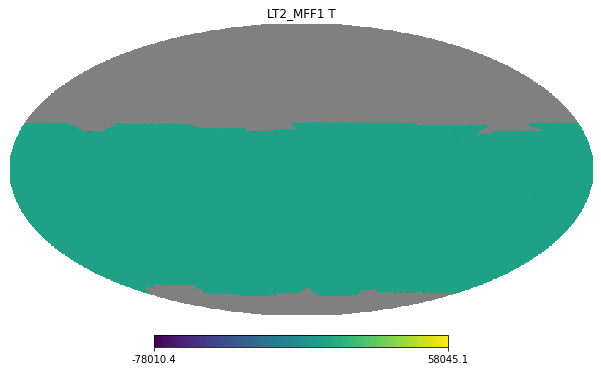

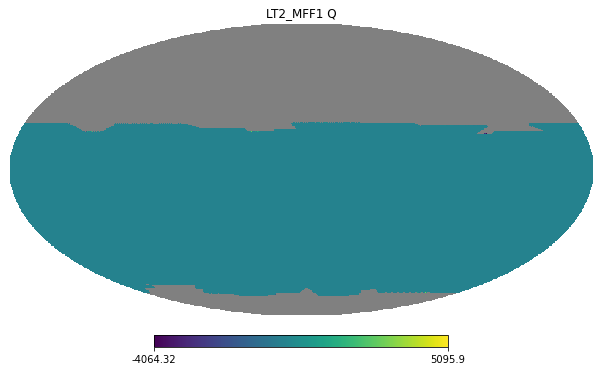

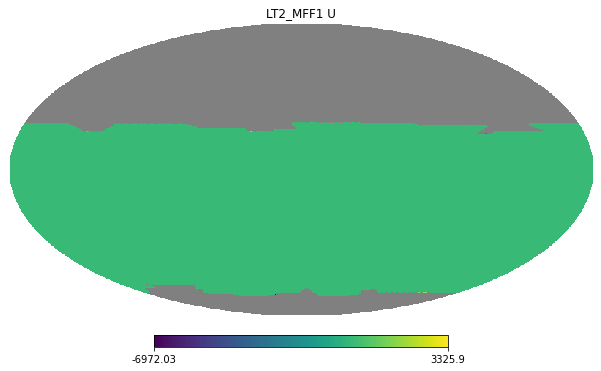

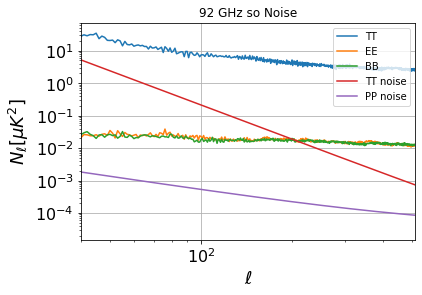

Retrieve data for LT2_MFF1_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)
Retrieve data for LT2_MFF2_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)


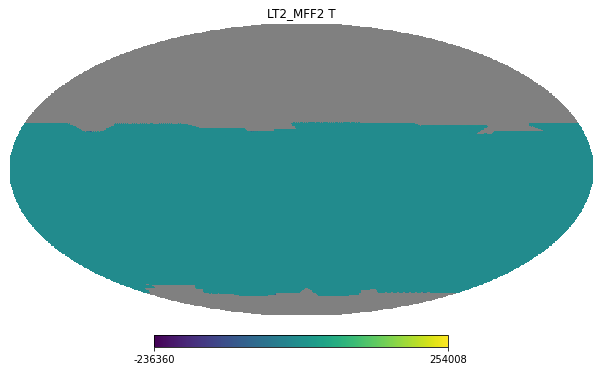

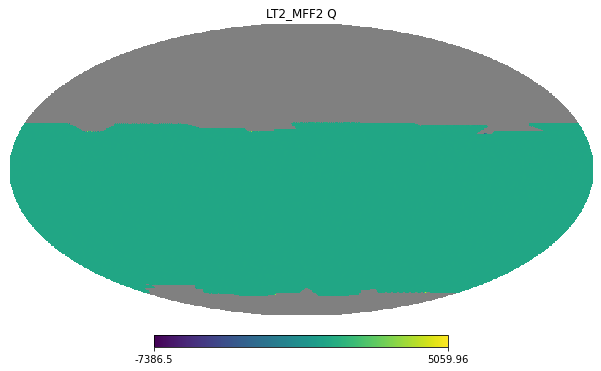

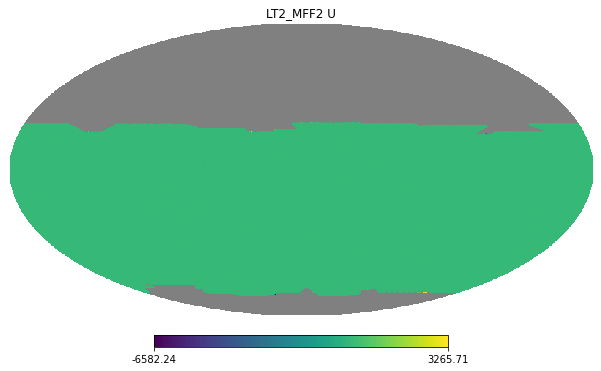

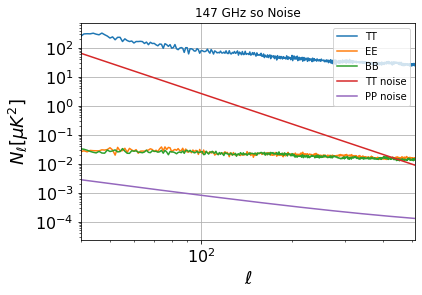

Retrieve data for LT1_UHF1_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)
Retrieve data for LT1_UHF2_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)


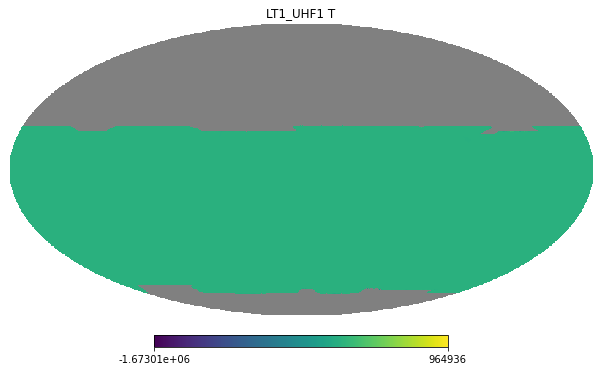

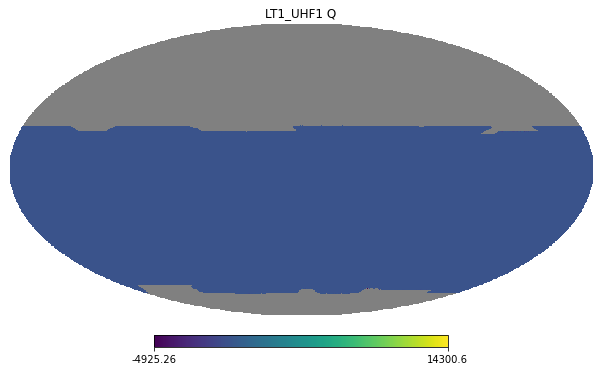

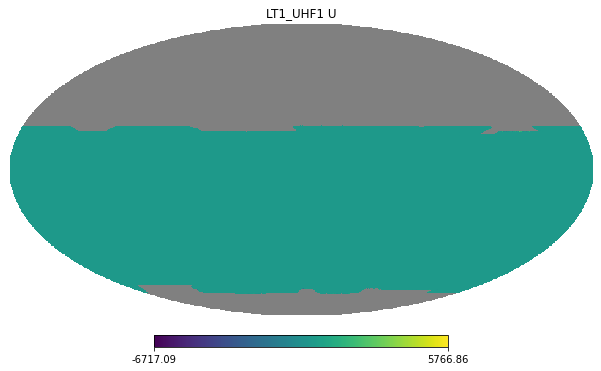

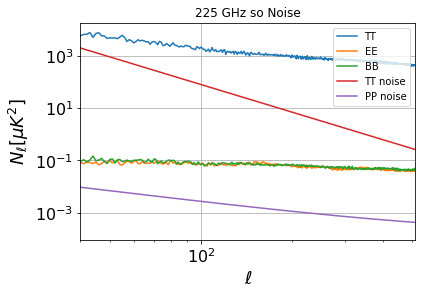

Retrieve data for LT1_UHF1_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)
Retrieve data for LT1_UHF2_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)


KeyboardInterrupt: 

In [27]:
import healpy as hp

seed = 0
NSIDE = 256
hitmap_path = "/Users/stevekchoi/work/build/Sensitivity-Calculator/src/sensitivity_calculator/data/ccat_uniform_coverage_nside" + str(NSIDE) + "_201021.fits"
mask_path = "/Users/stevekchoi/work/build/Sensitivity-Calculator/src/sensitivity_calculator/data/nside" + str(NSIDE) + "_lat_cut_b10_230619.fits"
# zf = sens.zeroHitmapFraction(hitmap_path, NSIDE)
def get_hivon_fsky(mask):
    npix = len(mask)
    non0 = np.where(mask!=0)[0]
    fs = len(non0)/float(npix)
    w2 = np.sum(mask[non0]**2)/(npix*fs)
    w4 = np.sum(mask[non0]**4)/(npix*fs)
    return fs*w2**2/w4

# hitmap = hp.ud_grade(
#             hp.read_map(hitmap_path, dtype=np.float64),
#             nside_out=NSIDE,
#         )

# galmask = hp.ud_grade(
#             hp.read_map(mask_path, dtype=np.float64),
#             nside_out=NSIDE,
#         )


hitm = hp.read_map(hitmap_path)
maskm = hp.read_map(mask_path)
zf = get_hivon_fsky(hitm*maskm)

print("zf:", zf)

freq_list = np.array([222,280,348,405,850])

ccat_col = []

for pysm_components, sim_noise in zip(["d0,s0", None], [False, True]):
    for i in range(1,6):
        band = "HF%i"%i
        instrument = "LC%i"%i
        freq = "%i GHz"%freq_list[i-1]
        print(band,instrument,freq)
        nl_ind = 5-i
        ccat_sim = sens.ccat_mapsims(
            inputs, outputs, band, instrument, pysm_components, seed, data_C, sim_cmb=False, sim_noise=sim_noise, hitmap_path=hitmap_path, NSIDE=NSIDE)
        ccat_sim[ccat_sim==hp.UNSEEN] = 0
#         hp.mollview(maskm)
#         hp.mollview(ccat_sim[0])
#         plt.show()
        ccat_cls = hp.sphtfunc.anafast(hitm*maskm*ccat_sim)
        ell_ccat = np.arange(len(ccat_cls[0]))
        ccat_col.append(ccat_cls)
        ell_ccat = np.arange(len(ccat_cls[0]))
        ccat_col.append(ccat_cls)
        lmax = NSIDE*2
        plt.plot(ell_ccat,ccat_cls[0]/zf,label='TT')
        plt.plot(ell_ccat,ccat_cls[1]/zf,label='EE')
        plt.plot(ell_ccat,ccat_cls[2]/zf,label='BB')
        plt.plot(ell,N_ell_T_full[nl_ind],label='TT noise')
        plt.plot(ell,N_ell_P_full[nl_ind],label='PP noise')
        plt.title("%s CCAT "%freq + ("Noise" if sim_noise else "Signal"))
        plt.yscale('log')
        plt.xscale('log')
        plt.xlim(4*10**1, lmax)
#         plt.ylim(10**-5, 10**12)
        plt.xlabel('$\ell$',fontsize=18)
        plt.ylabel(("$N_\ell$" if sim_noise else "$C_\ell$")+'$ [\mu K^2]$',fontsize=18)
        plt.xticks(fontsize=16)
        plt.yticks(fontsize=16)
        plt.legend(loc='upper right')
        plt.grid()
        plt.show()
#         sens.plotPowerSpectrum(ccat_cls[0], ccat_cls[1], ccat_cls[2],
#                           "%s CCAT "%freq + ("Noise" if sim_noise else "Signal"), zf=zf, TT_theory=N_ell_T_full[nl_ind], PP_theory=N_ell_P_full[nl_ind])


# so280 = sens.so_mapsims("UHF2", "LT0", pysm_components,
#                    seed, sim_cmb=False, sim_noise=sim_noise, NSIDE=NSIDE, hitmap=hitmap)
# so280cls = hp.sphtfunc.anafast(so280)
# sens.plotPowerSpectrum(so280cls[0], so280cls[1], so280cls[2],
#                   "280 GHz SO " + ("Noise" if sim_noise else "Signal"), zf=zf)

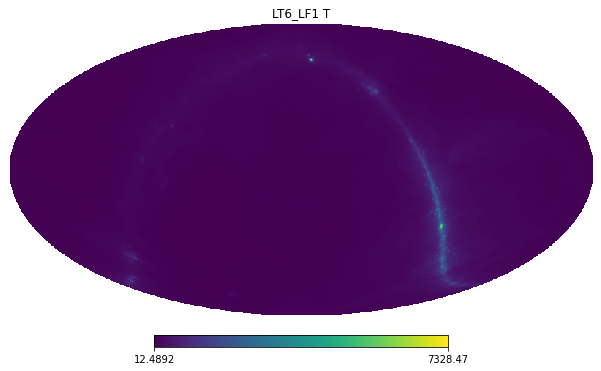

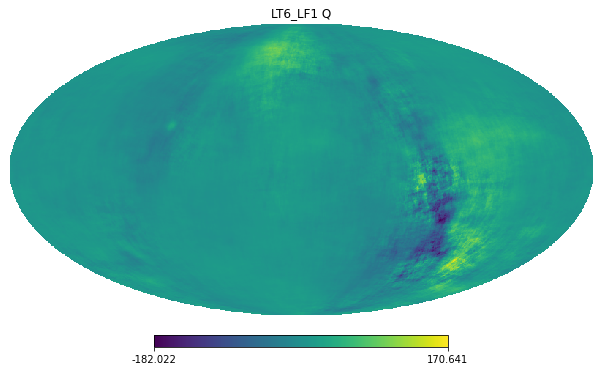

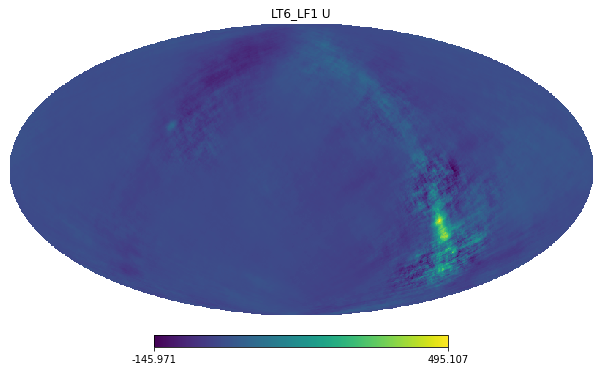

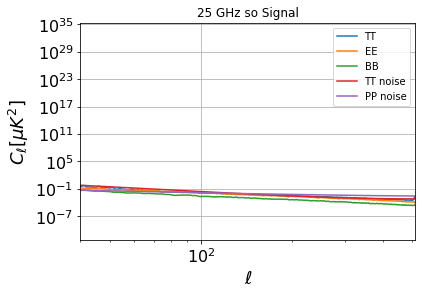

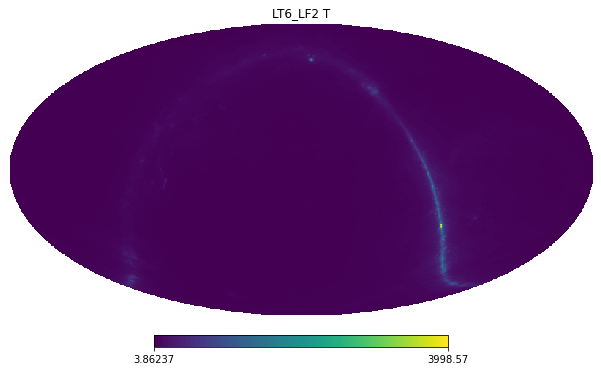

...

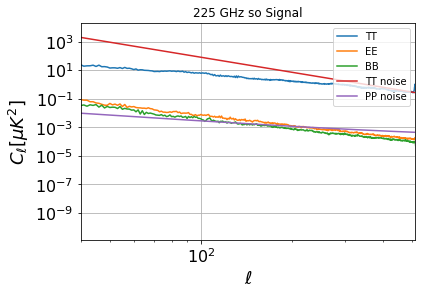

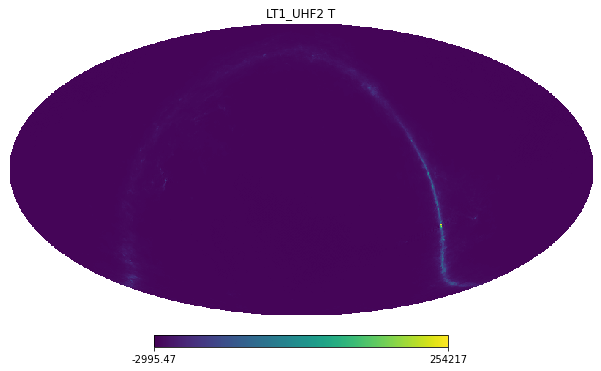

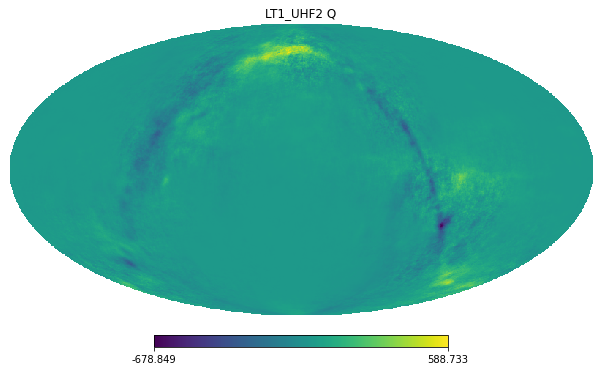

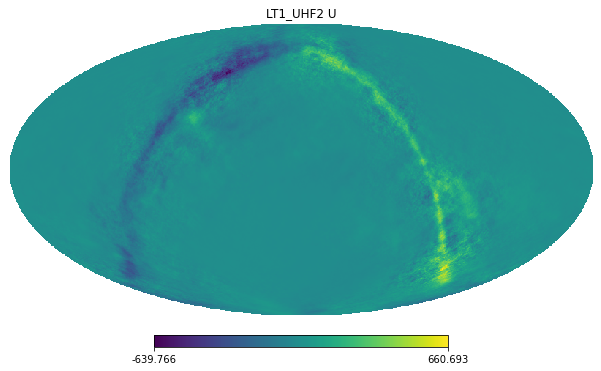

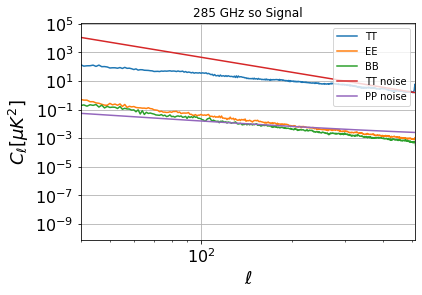

Retrieve data for LT6_LF1_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)
Retrieve data for LT6_LF2_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)


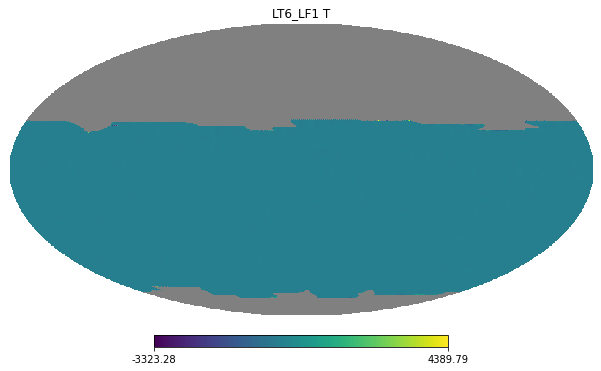

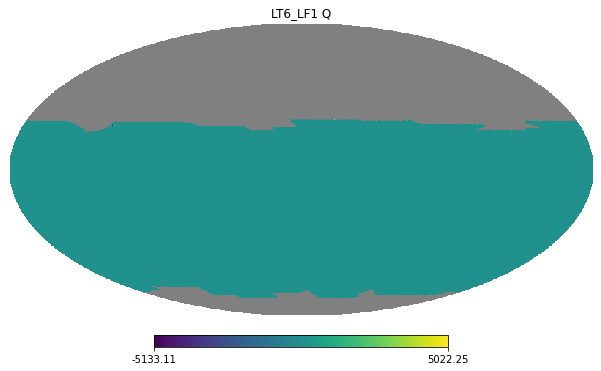

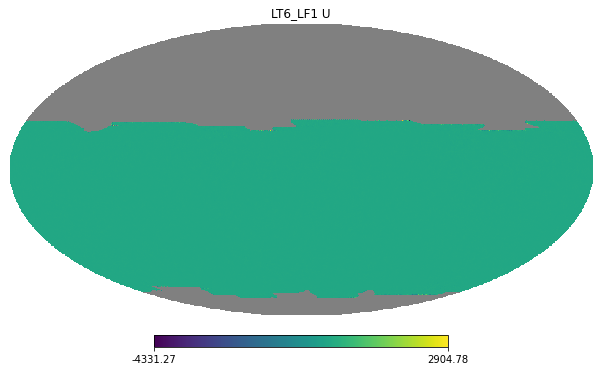

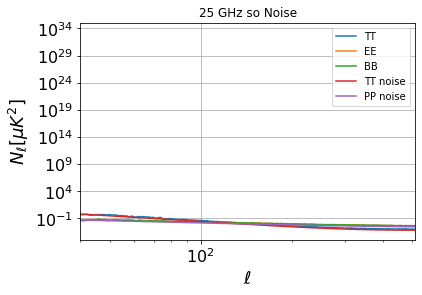

Retrieve data for LT6_LF1_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)
Retrieve data for LT6_LF2_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)


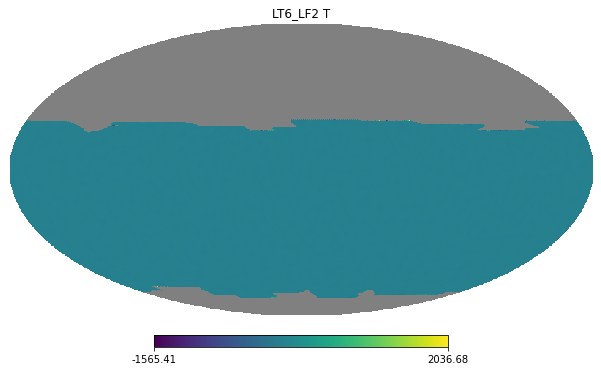

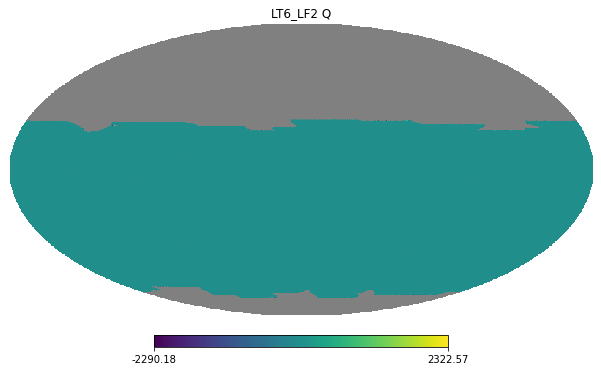

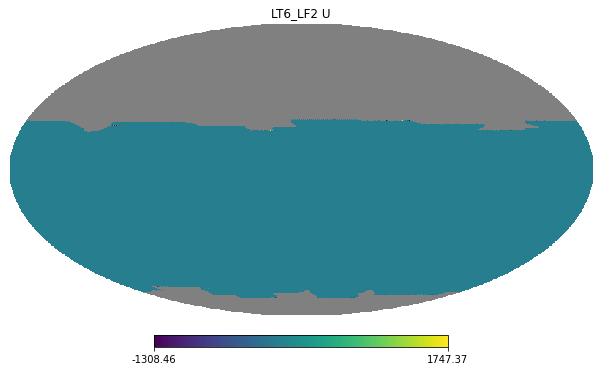

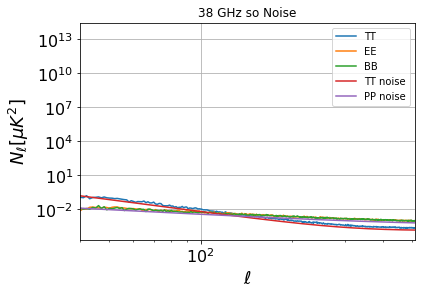

Retrieve data for LT2_MFF1_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)
Retrieve data for LT2_MFF2_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)


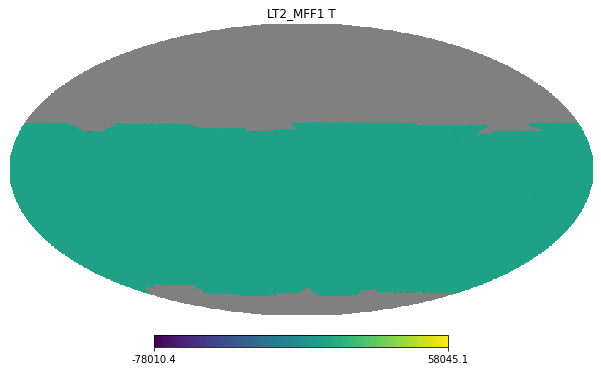

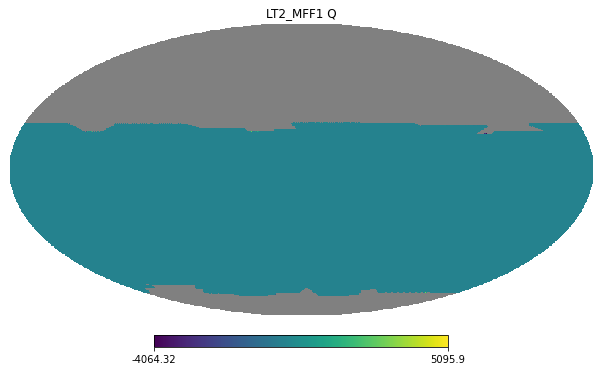

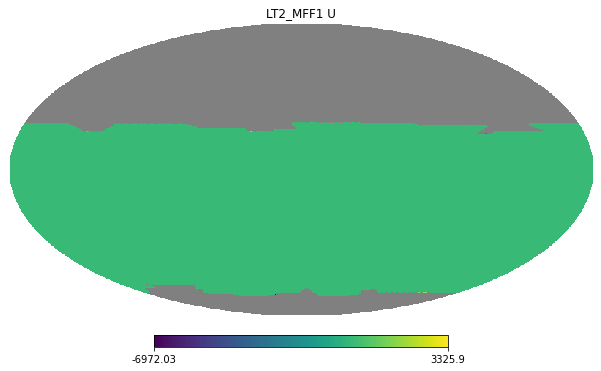

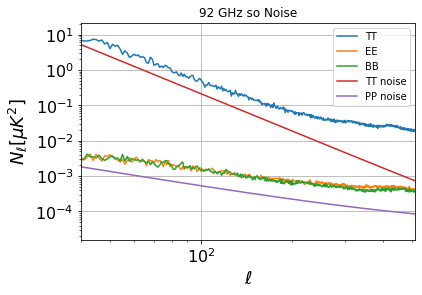

Retrieve data for LT2_MFF1_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)
Retrieve data for LT2_MFF2_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)


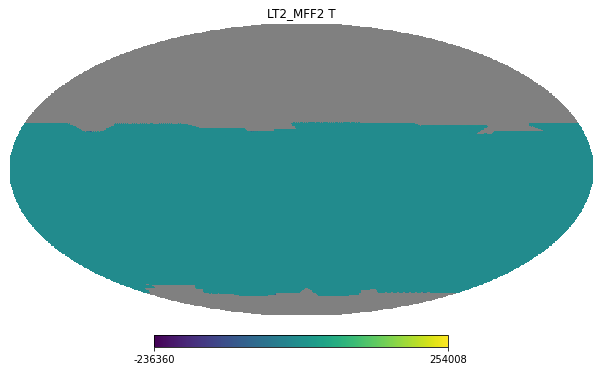

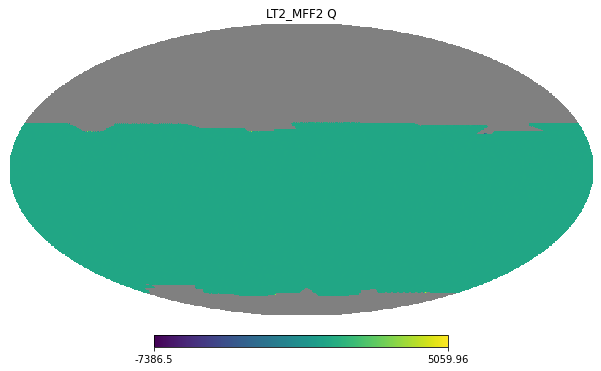

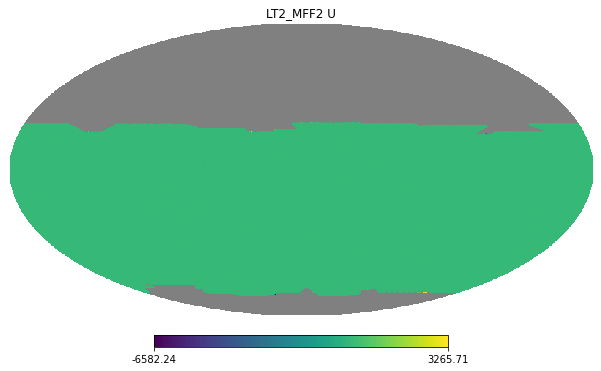

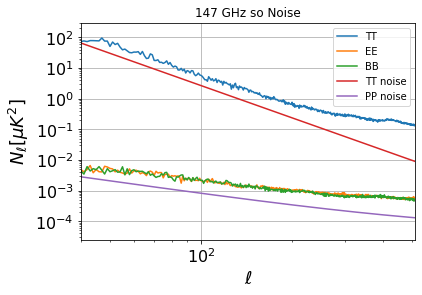

Retrieve data for LT1_UHF1_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)
Retrieve data for LT1_UHF2_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)


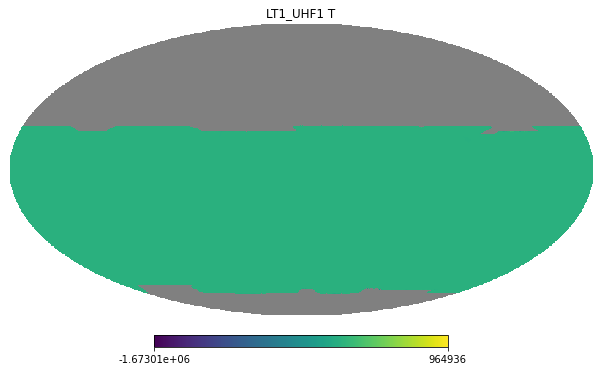

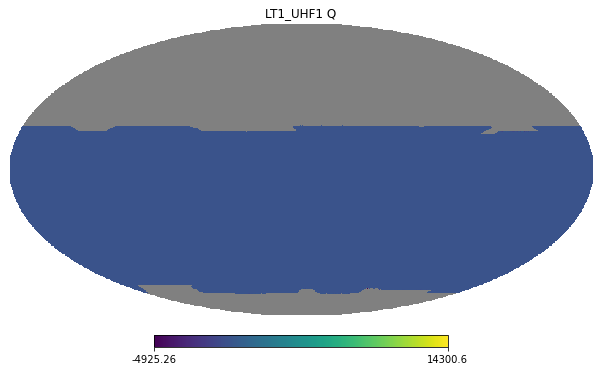

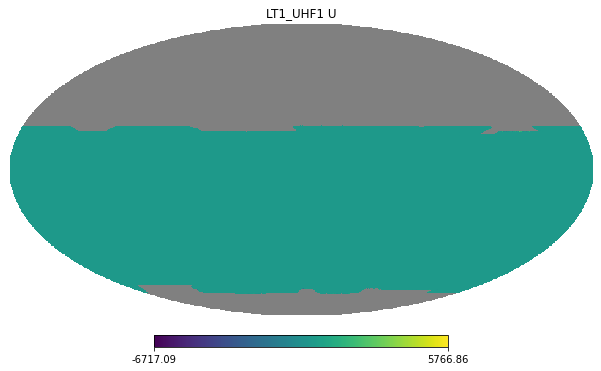

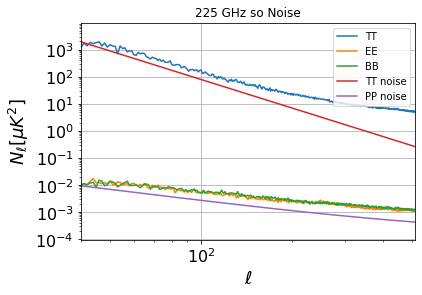

Retrieve data for LT1_UHF1_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)
Retrieve data for LT1_UHF2_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)


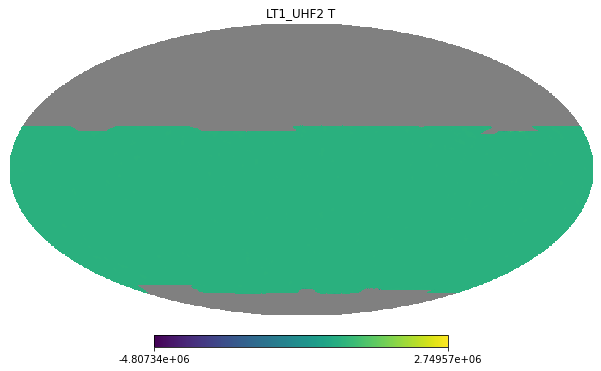

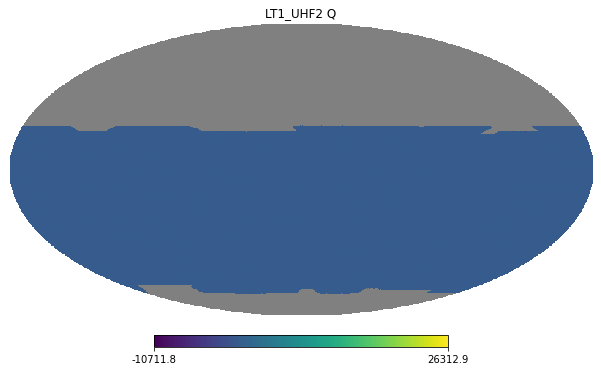

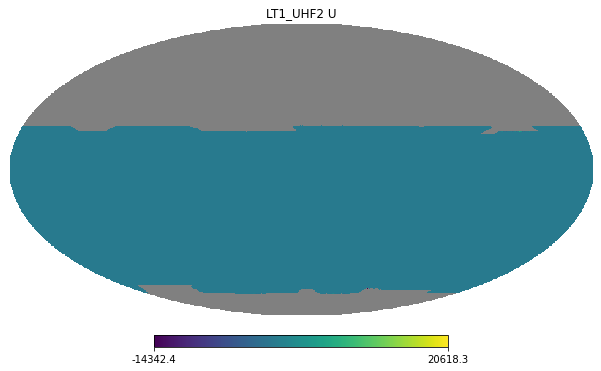

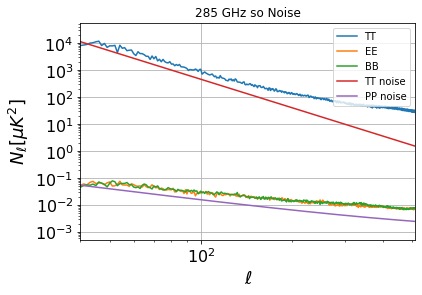

In [28]:
so_bands = ['LF1','LF2','MFF1','MFF2','UHF1','UHF2']
so_instruments = ['LT6','LT6','LT2','LT2','LT1','LT1']
so_freq_list = np.array([25.7, 38.9, 92, 147.5, 225.7, 285.4])
ell_s = 30
so_col = []
for pysm_components, sim_noise in zip(["d0,s0", None], [False, True]):
    for i in range(6):
        band = so_bands[i]
        instrument = so_instruments[i]
        freq = "%i GHz"%so_freq_list[i]
        nl_ind = i
        so_sim = sens.so_mapsims(band, instrument, pysm_components, seed, sim_cmb=False, 
                                 sim_noise=sim_noise, hitmap=hitm, NSIDE=NSIDE)
        so_sim[so_sim==hp.UNSEEN] = 0        
#         hp.mollview(maskm*so_sim[0])
#         plt.show()
        so_cls = hp.sphtfunc.anafast(hitm*maskm*so_sim)
        ell_so = np.arange(len(so_cls[0]))
        so_col.append(so_cls)
        lmax = NSIDE*2
        plt.plot(ell_so[ell_s:],so_cls[0][ell_s:]/zf,label='TT')
        plt.plot(ell_so[ell_s:],so_cls[1][ell_s:]/zf,label='EE')
        plt.plot(ell_so[ell_s:],so_cls[2][ell_s:]/zf,label='BB')
        if 'MF' in band:
            plt.plot(ell_LA[ell_s:],N_ell_LA_T_full[i][ell_s:]*3,label='TT noise')
            plt.plot(ell_LA[ell_s:],N_ell_LA_P_full[i][ell_s:]*3,label='PP noise')
        if 'HF' in band:
            plt.plot(ell_LA[ell_s:],N_ell_LA_T_full[i][ell_s:]*2,label='TT noise')
            plt.plot(ell_LA[ell_s:],N_ell_LA_P_full[i][ell_s:]*2,label='PP noise')     
        if 'LF' in band:
            plt.plot(ell_LA[ell_s:],N_ell_LA_T_full[i][ell_s:],label='TT noise')
            plt.plot(ell_LA[ell_s:],N_ell_LA_P_full[i][ell_s:],label='PP noise')            
        plt.title("%s so "%freq + ("Noise" if sim_noise else "Signal"))
        plt.yscale('log')
        plt.xscale('log')
        plt.xlim(4*10**1, lmax)
#         plt.ylim(10**-5, 10**12)
        plt.xlabel('$\ell$',fontsize=18)
        plt.ylabel(("$N_\ell$" if sim_noise else "$C_\ell$")+'$ [\mu K^2]$',fontsize=18)
        plt.xticks(fontsize=16)
        plt.yticks(fontsize=16)
        plt.legend(loc='upper right')
        plt.grid()
        plt.show()
#         sens.plotPowerSpectrum(so_cls[0], so_cls[1], so_cls[2],
#                           "%s CCAT "%freq + ("Noise" if sim_noise else "Signal"), zf=zf, TT_theory=N_ell_T_full[nl_ind], PP_theory=N_ell_P_full[nl_ind])


Text(0.5, 1.0, '')

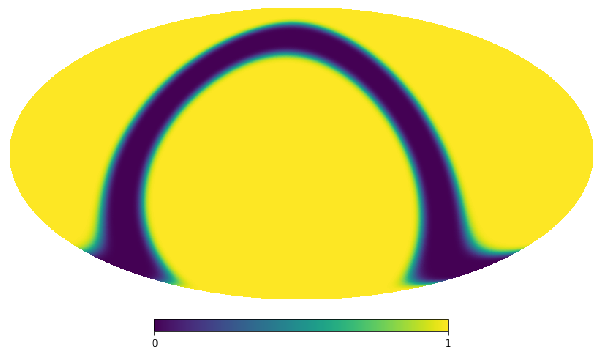

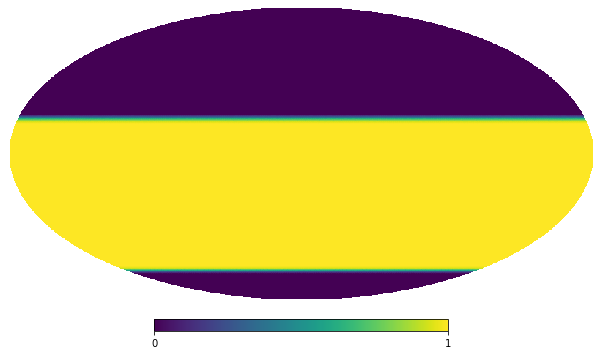

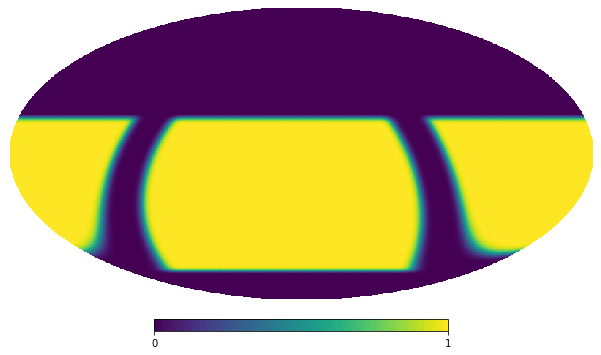

In [14]:
NSIDE = 512
hitmap_path = "/Users/stevekchoi/work/build/Sensitivity-Calculator/src/sensitivity_calculator/data/ccat_uniform_coverage_nside" + str(NSIDE) + "_201021.fits"
mask_path = "/Users/stevekchoi/work/build/Sensitivity-Calculator/src/sensitivity_calculator/data/nside" + str(NSIDE) + "_lat_cut_b10_230619.fits"
hitm = hp.read_map(hitmap_path)
maskm = hp.read_map(mask_path)
hp.mollview(maskm)
plt.title('')
hp.mollview(hitm)
plt.title('')
hp.mollview(hitm*maskm)
plt.title('')


In [15]:
so_col = np.array(so_col)[:,:3].reshape(2,6,3,-1)/zf
so_col.shape

(2, 6, 3, 1536)

In [16]:
ccat_col = np.array(ccat_col)[:,:3].reshape(2,5,3,-1)/zf
ccat_col.shape

(2, 5, 3, 768)

In [17]:
ccat_col /= zf

In [18]:
so_col /= zf

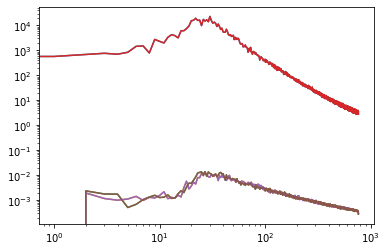

In [19]:
plt.plot(ccat_col[0,0,0])
plt.plot(ccat_col[0,0,1])
plt.plot(ccat_col[0,0,2])
plt.plot(ccat_col[1,0,0])
plt.plot(ccat_col[1,0,1])
plt.plot(ccat_col[1,0,2])
plt.xscale('log')
plt.yscale('log')

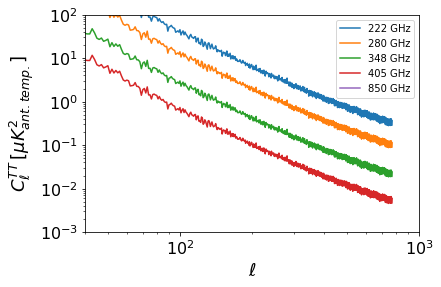

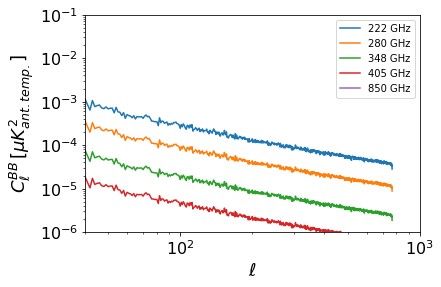

In [20]:
freq_list = np.array(freq_list)
beta_d = 1.54
T_dust = 20
beta_s = -2.95

ps_ind = 0

for i in range(len(freq_list)):
    plt.plot(ell_ccat,ccat_col[0,i,ps_ind,:]*sfs.CMB_to_A(freq_list)[i]**2,label='%i GHz'%freq_list[i])

plt.legend()
plt.yscale('log')
plt.xscale('log')
plt.xlabel('$\ell$',fontsize=18)
plt.ylabel('$C^{TT}_{\ell} \,[\mu K_{ant. temp.}^2]$',fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylim(1e-3,1e2)
plt.xlim(40,1000)
plt.show()

ps_ind = 2
# sfs.CMB_to_A(freq_list)
# sfs.pl_dust_power(freq_list,353.,beta_d,T_dust)
# sfs.sync_power(so_freq_list,23.,beta_s)
# sfs.A_to_CMB(freq_list)

for i in range(len(freq_list)):
    plt.plot(ell_ccat,ccat_col[0,i,ps_ind,:]*sfs.CMB_to_A(freq_list)[i]**2,label='%i GHz'%freq_list[i])

plt.legend()
plt.yscale('log')
plt.xscale('log')
plt.xlim(40,1000)
plt.ylim(1e-6,1e-1)
plt.xlabel('$\ell$',fontsize=18)
plt.ylabel('$C^{BB}_{\ell} \,[\mu K_{ant. temp.}^2]$',fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()


([<matplotlib.axis.XTick at 0x16548d730>,
 [Text(20, 0, '20'),
  Text(30, 0, '30'),
  Text(50, 0, '50'),
  Text(70, 0, '70'),
  Text(100, 0, '100'),
  Text(200, 0, '200'),
  Text(300, 0, '300'),
  Text(500, 0, '500'),
  Text(1000, 0, '1000')])

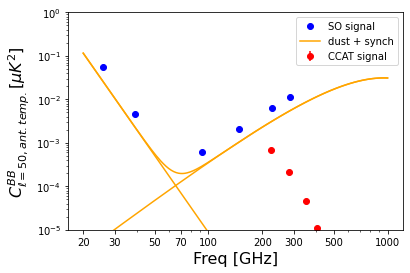

In [21]:
freq_model = np.arange(20,1000)
dust_model = sfs.pl_dust_power(freq_model,353.,beta_d,T_dust)*0.0044/zf
sync_model = sfs.sync_power(freq_model,23.,beta_s)*0.0252/zf
fg_model = dust_model + sync_model
ell0 = 50
ell_bw = 10
gfac = pau.get_analytic_var_auto(zf,ell0,ell_bw)
ccat_sig = ccat_col[0,:,ps_ind,ell0]*sfs.CMB_to_A(freq_list)**2
ccat_noise = ccat_col[1,:,ps_ind,ell0]*sfs.CMB_to_A(freq_list)**2
ccat_err = gfac*(ccat_sig+ccat_noise)
plt.plot(so_freq_list,so_col[0,:,ps_ind,ell0]*sfs.CMB_to_A(so_freq_list)**2,'o',color='Blue',label='SO signal')
# plt.plot(so_freq_list,so_col[1,:,ps_ind,ell0]*sfs.CMB_to_A(so_freq_list)**2,'x',color='Blue',label='SO noise')
plt.errorbar(freq_list,ccat_sig,ccat_err,fmt='o',color='Red',label='CCAT signal')
# plt.plot(freq_list,ccat_noise,'x',color='Red',label='CCAT noise')
plt.plot(freq_model,fg_model,'-',color='Orange',label='dust + synch')
plt.plot(freq_model,dust_model,'-',color='Orange')
plt.plot(freq_model,sync_model,'-',color='Orange')
plt.ylim(1e-5,1)
plt.legend(loc=0)
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Freq [GHz]',fontsize=16)
plt.ylabel('$C^{BB}_{\ell=%i, ant. temp.} [\mu K^2]$'%ell0,fontsize=16)
xticks = [20,30,50,70,100,200,300,500,1000]
plt.xticks(xticks,xticks)


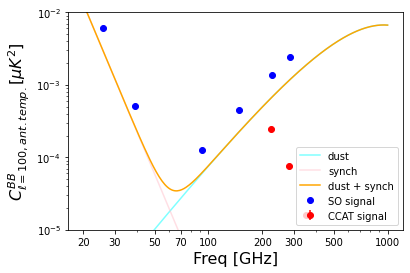

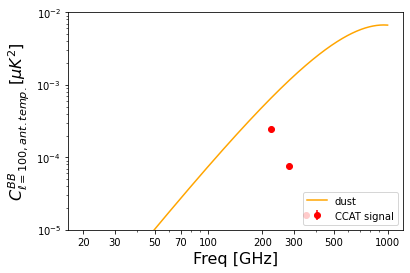

In [22]:
dust_model = sfs.pl_dust_power(freq_model,353.,beta_d,T_dust)*0.0019
sync_model = sfs.sync_power(freq_model,23.,beta_s)*0.0058
fg_model = dust_model + sync_model
ell0 = 100
ell_bw = 60
gfac = pau.get_analytic_var_auto(zf,ell0,ell_bw)
ccat_sig = ccat_col[0,:,ps_ind,ell0]*sfs.CMB_to_A(freq_list)**2
ccat_noise = ccat_col[1,:,ps_ind,ell0]*sfs.CMB_to_A(freq_list)**2
ccat_err = gfac*(ccat_sig+ccat_noise)
plt.plot(freq_model,dust_model,'-',color='cyan',alpha=0.5,label='dust')
plt.plot(freq_model,sync_model,'-',color='pink',alpha=0.5,label='synch')
plt.plot(freq_model,fg_model,'-',color='Orange',label='dust + synch')
plt.plot(so_freq_list,so_col[0,:,ps_ind,ell0]*sfs.CMB_to_A(so_freq_list)**2,'o',color='Blue',label='SO signal')
# plt.plot(so_freq_list,so_col[1,:,ps_ind,ell0]*sfs.CMB_to_A(so_freq_list)**2,'x',color='Blue',label='SO noise')
plt.errorbar(freq_list,ccat_sig,ccat_err,fmt='o',color='Red',label='CCAT signal')
# plt.plot(freq_list,ccat_noise,'x',color='Red',label='CCAT noise')
plt.ylim(1e-5,1e-2)
plt.legend(loc=4)
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Freq [GHz]',fontsize=16)
plt.ylabel('$C^{BB}_{\ell=%i, ant. temp.} [\mu K^2]$'%ell0,fontsize=16)
xticks = [20,30,50,70,100,200,300,500,1000]
plt.xticks(xticks,xticks)
plt.show()

# plt.plot(so_freq_list,so_col[0,:,ps_ind,ell0]*sfs.CMB_to_A(so_freq_list)**2,'o',color='Blue',label='SO signal')
# plt.plot(so_freq_list,so_col[1,:,ps_ind,ell0]*sfs.CMB_to_A(so_freq_list)**2,'x',color='Blue',label='SO noise')
plt.plot(freq_model,dust_model,'-',color='Orange',label='dust')
plt.errorbar(freq_list,ccat_sig,ccat_err,fmt='o',color='Red',label='CCAT signal')
# plt.plot(freq_list,ccat_noise,'x',color='Red',label='CCAT noise')

plt.ylim(1e-5,1e-2)
plt.legend(loc=4)
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Freq [GHz]',fontsize=16)
plt.ylabel('$C^{BB}_{\ell=%i, ant. temp.} [\mu K^2]$'%ell0,fontsize=16)
xticks = [20,30,50,70,100,200,300,500,1000]
plt.xticks(xticks,xticks)
plt.show()


# plt.plot(freq_list,ccat_sig/ccat_err)
# plt.show()

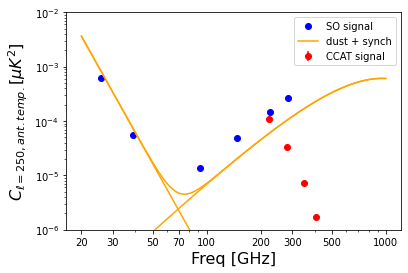

In [23]:
dust_model = sfs.pl_dust_power(freq_model,353.,beta_d,T_dust)*0.000173
sync_model = sfs.sync_power(freq_model,23.,beta_s)*0.0016
fg_model = dust_model + sync_model
ell0 = 250
ell_bw = 60
gfac = pau.get_analytic_var_auto(zf,ell0,ell_bw)
ccat_sig = ccat_col[0,:,ps_ind,ell0]*sfs.CMB_to_A(freq_list)**2
ccat_noise = ccat_col[1,:,ps_ind,ell0]*sfs.CMB_to_A(freq_list)**2
ccat_err = gfac*(ccat_sig+ccat_noise)
plt.plot(so_freq_list,so_col[0,:,ps_ind,ell0]*sfs.CMB_to_A(so_freq_list)**2,'o',color='Blue',label='SO signal')
# plt.plot(so_freq_list,so_col[1,:,ps_ind,ell0]*sfs.CMB_to_A(so_freq_list)**2,'x',color='Blue',label='SO noise')
plt.errorbar(freq_list,ccat_sig,ccat_err,fmt='o',color='Red',label='CCAT signal')
# plt.plot(freq_list,ccat_noise,'x',color='Red',label='CCAT noise')
plt.plot(freq_model,fg_model,'-',color='Orange',label='dust + synch')
plt.plot(freq_model,dust_model,'-',color='Orange')
plt.plot(freq_model,sync_model,'-',color='Orange')
plt.ylim(1e-6,1e-2)
plt.legend(loc=0)
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Freq [GHz]',fontsize=16)
plt.ylabel('$C_{\ell=%i, ant. temp.} [\mu K^2]$'%ell0,fontsize=16)
xticks = [20,30,50,70,100,200,300,500,1000]
plt.xticks(xticks,xticks)
plt.show()

# plt.plot(freq_list,ccat_sig/ccat_err)
# plt.show()

In [24]:
dust_model = sfs.pl_dust_power(freq_model,353.,beta_d,T_dust)*0.000008
sync_model = sfs.sync_power(freq_model,23.,beta_s)*0.0000045
fg_model = dust_model + sync_model
ell0 = 1000
ell_bw = 200
gfac = pau.get_analytic_var_auto(zf,ell0,ell_bw)
ccat_sig = ccat_col[0,:,ps_ind,ell0]*sfs.CMB_to_A(freq_list)**2
ccat_noise = ccat_col[1,:,ps_ind,ell0]*sfs.CMB_to_A(freq_list)**2
ccat_err = gfac*(ccat_sig+ccat_noise)
plt.plot(freq_model,dust_model,'-',color='cyan',alpha=0.5,label='dust')
plt.plot(freq_model,sync_model,'-',color='pink',alpha=0.5,label='synch')
plt.plot(freq_model,fg_model,'-',color='Orange',label='dust + synch')

plt.plot(so_freq_list,so_col[0,:,ps_ind,ell0]*sfs.CMB_to_A(so_freq_list)**2,'o',color='Blue',label='SO signal')
# plt.plot(so_freq_list,so_col[1,:,ps_ind,ell0]*sfs.CMB_to_A(so_freq_list)**2,'x',color='Blue',label='SO noise')
plt.errorbar(freq_list,ccat_sig,ccat_err,fmt='o',color='Red',label='CCAT signal')
# plt.plot(freq_list,ccat_noise,'x',color='Red',label='CCAT noise')
plt.ylim(1e-8,1e-4)
plt.legend(loc=0)
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Freq [GHz]',fontsize=16)
plt.ylabel('$C^{BB}_{\ell=%i, ant. temp.} [\mu K^2]$'%ell0,fontsize=16)
xticks = [20,30,50,70,100,200,300,500,1000]
plt.xticks(xticks,xticks)
plt.show()

plt.plot(freq_list,ccat_sig/ccat_err)
plt.show()

IndexError: index 1000 is out of bounds for axis 3 with size 768

In [ ]:
dust_model = sfs.pl_dust_power(freq_model,353.,beta_d,T_dust)*0.000004
sync_model = sfs.sync_power(freq_model,23.,beta_s)*0.0000001
fg_model = dust_model + sync_model
ell0 = 2000
ell_bw = 800
gfac = pau.get_analytic_var_auto(zf,ell0,ell_bw)
ccat_sig = ccat_col[0,:,ps_ind,ell0]*sfs.CMB_to_A(freq_list)**2
ccat_noise = ccat_col[1,:,ps_ind,ell0]*sfs.CMB_to_A(freq_list)**2
ccat_err = gfac*(ccat_sig+ccat_noise)
plt.plot(so_freq_list,so_col[0,:,ps_ind,ell0]*sfs.CMB_to_A(so_freq_list)**2,'o',color='Blue',label='SO signal')
# plt.plot(so_freq_list,so_col[1,:,ps_ind,ell0]*sfs.CMB_to_A(so_freq_list)**2,'x',color='Blue',label='SO noise')
plt.errorbar(freq_list,ccat_sig,ccat_err,fmt='o',color='Red',label='CCAT signal')
# plt.plot(freq_list,ccat_noise,'x',color='Red',label='CCAT noise')
plt.plot(freq_model,fg_model,'-',color='Orange',label='dust + synch')
plt.plot(freq_model,dust_model,'-',color='Orange')
plt.plot(freq_model,sync_model,'-',color='Orange')
plt.ylim(1e-8,1e-5)
plt.legend(loc=0)
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Freq [GHz]',fontsize=16)
plt.ylabel('$C_{\ell=%i, ant. temp.} [\mu K^2]$'%ell0,fontsize=16)
xticks = [20,30,50,70,100,200,300,500,1000]
plt.xticks(xticks,xticks)
plt.show()

plt.plot(freq_list,ccat_sig/ccat_err)
plt.show()